## - Import

In [1]:
%matplotlib inline
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torch import autograd
from torch.autograd import Variable
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from torchvision.datasets import ImageFolder
from tqdm import tqdm
import math
import torch.nn.functional as F

/home/hoge/.local/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import random
import numpy as np
import torch

def torch_fix_seed(seed=42):
    # Python random
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Pytorch
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.use_deterministic_algorithms = True


torch_fix_seed()

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

print('torch version:',torch.__version__)
print('device:', device)

torch version: 1.11.0+cu113
device: cuda


## - Parameters

In [4]:
img_size = 64 # Image size
batch_size = 16  # Batch size

# Model
z_size = 100
ngf = 32
ndf = 64
generator_layer_size = [256, 512, 1024, 2048]
discriminator_layer_size = [2048, 1024, 512, 256]

# Training
epochs = 100 # Train epochs
learning_rate_G = 2e-5
learning_rate_D = 1e-5

## - Pytorch Dataset, DataLoader: Fashion MNIST

In [5]:
class_list = [chr(i + 65) for i in range(26)]
class_num = len(class_list)

In [6]:
class ImageTransform():
  def __init__(self, mean, std):
    self.data_transform = transforms.Compose([
    transforms.Grayscale(),
    transforms.ToTensor(),
    transforms.Resize((64, 64)),
    transforms.Normalize(mean, std)
    ])

  def __call__(self, img):
    return self.data_transform(img)

In [7]:
mean = (0.5,)
std = (0.5,)
images = ImageFolder( "../GoogleFonts/all", transform = ImageTransform(mean, std))
data_loader = DataLoader(images, batch_size = batch_size, shuffle = True, drop_last=True)

In [8]:
# print(dataset_GAN.X_train.shape)

# d = torch.from_numpy(dataset_GAN.X_train).float().clone()
# l = torch.from_numpy(dataset_GAN.y_train).long().clone()
# data_loader = zip(d, l)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


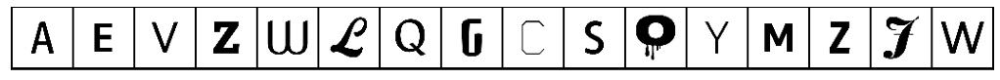

In [9]:
for images, labels in data_loader:
    fig, ax = plt.subplots(figsize=(18,10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images, nrow=16).permute(1,2,0))
    break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


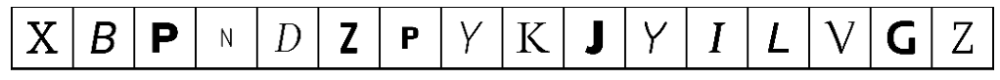

In [10]:
for images, labels in data_loader:
    fig, ax = plt.subplots(figsize=(18,10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images, nrow=16).permute(1,2,0))
    break

In [11]:
def onehot_encode(label, n_class=26):  
    # ラベルをOne-Hoe形式に変換
    eye = torch.eye(n_class).to(device)
    # ランダムベクトルあるいは画像と連結するために(B, c_class, 1, 1)のTensorにして戻す
    return eye[label].view(-1, n_class, 1, 1)
    
def concat_image_label(image, label, n_class=26):
    # 画像とラベルを連結する
    oh_label = onehot_encode(label, n_class).to(device)       # ラベルをOne-Hot形式に変換
    oh_label = oh_label.expand(16, n_class, 64, 64)  # ラベルを画像サイズに拡大
    return torch.cat((image, oh_label), dim=1)    # 画像とラベルをチャネル方向（dim=1）で連結
 
def concat_noise_label(noise, label, n_class=26):
    # ランダムベクトルとラベルを連結する
    oh_label = onehot_encode(label, n_class).to(device)     # ラベルをOne-Hot形式に変換
    return torch.cat((noise, oh_label), dim=1)  # ランダムベクトルとラベルを連結

## - Generator

In [12]:
class Generator(nn.Module):
    def __init__(self, generator_layer_size, z_size, img_size, class_num):
        super().__init__()
        
        self.z_size = z_size
        self.img_size = img_size
        
        # self.label_emb = nn.Embedding(class_num, class_num)
        
        self.model = nn.Sequential(
            nn.ConvTranspose2d(self.z_size + 26, ngf * 32, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 32),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 32, ngf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, 1, 3, 1, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, z, labels):
        
        # Reshape z
        # z = z.view(-1, self.z_size)
        
        # One-hot vector to embedding vector
        # c = self.label_emb(labels)
        
        # Concat image & label
        # x = torch.cat([z, c], 1)

        x = concat_noise_label(z, labels)


        # rlabels_list = []
        # for label in rlabels:
        #     l = torch.Tensor([[[label.item()]]])
        #     rlabels_list.append(l)
        # rlabels_list = torch.stack(rlabels_list).to(device)

        # x = torch.cat((x, rlabels_list), dim=1)
        
        # Generator out
        out = self.model(x)
        
        return out
        # return out.view(-1, self.img_size, self.img_size)

## - Discriminator

In [13]:
class Discriminator(nn.Module):
    def __init__(self, discriminator_layer_size, img_size, class_num):
        super().__init__()
        
        # self.label_emb = nn.Embedding(class_num, class_num)
        self.img_size = img_size
        
        self.model = nn.Sequential(
            nn.Conv2d(27, ndf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 2, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, ndf * 8, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 8, 1, 0, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, x, labels):
        
        # Reshape fake image
        # x = x.view(-1, self.img_size * self.img_size)
        
        # One-hot vector to embedding vector
        # c = self.label_emb(labels)
    
        # Concat image & label
        # x = torch.cat([x, c], 1)

        x = concat_image_label(x, labels)
        
        # rlabels_list = []
        # for label in labels:
        #     l = torch.Tensor([[[label.item()]]])
        #     l = l.expand(1, 64, 64)
        #     rlabels_list.append(l)
        # rlabels_list = torch.stack(rlabels_list).to(device)

        # x = torch.cat((x, rlabels_list), dim=1)

        # Discriminator out
        
        out = self.model(x)
        
        return out.squeeze()

In [14]:
# Define generator
generator = Generator(generator_layer_size, z_size, img_size, class_num).to(device)
# Define discriminator
discriminator = Discriminator(discriminator_layer_size, img_size, class_num).to(device)

In [15]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(57600, 128)
        self.fc2 = nn.Linear(128, 1)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.fc2(x)
        return x
# 使うデバイス（CPUかGPUか）の定義
model_list = []
for i in range(26):
    pretrained_model = "../GoogleFonts_reg/model/reg_" + chr(i + 65) + ".pth"
    # ネットワークの初期化
    model = Net().to(device)
    # 訓練済みモデルのロード
    model.load_state_dict(torch.load(pretrained_model, map_location='cpu'))
    # モデルを評価モードに設定。本チュートリアルの例では、これはドロップアウト層等を評価モードにするのに必要
    model.eval()
    model_list.append(model)

## - Adversarial Learning of Generator & Discriminator

In [16]:
# Loss function
criterion = nn.BCELoss()
criterion_r = nn.MSELoss()

In [17]:
# Optimizer
g_optimizer = torch.optim.Adam(generator.parameters(), lr=learning_rate_G)
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=learning_rate_D)

In [18]:
class DynamicWeight:

    def __init__(self, init_weight=0.1, L1_x=None, L1_y=None, L2_x=None, L2_y=None):
        self.init_weight = init_weight
        self.L1_x = L1_x
        self.L1_y = L1_y
        self.L2_x = L2_x
        self.L2_y = L2_y
        self.x_list = []
        self.y_list = []

    def calc_ratio(self, L1_x, L1_y, L2_x, L2_y):
        e = math.e

        w_x = L2_x / L1_x
        w_y = L2_y / L1_y
        
        e_x = e ** w_x
        e_y = e ** w_y
        
        r_x = e_x / (e_x + e_y)
        r_y = e_y / (e_x + e_y)

        return r_x, r_y

    def __call__(self, loss_x, loss_y):
        self.x_list.append(loss_x)
        self.y_list.append(loss_y)

        if self.L2_x is None:
            self.L2_x = self.L1_x
            self.L2_y = self.L1_y
            self.L1_x = loss_x
            self.L1_y = loss_y
            return 1, self.init_weight
        
        else:
            r_x, r_y = self.calc_ratio(self.L1_x, self.L1_y, self.L2_x, self.L2_y)
            self.L2_x = self.L1_x
            self.L2_y = self.L1_y
            self.L1_x = loss_x
            self.L1_y = loss_y
            return r_x, r_y

    def plot(self):
        return self.x_list, self.y_list

In [19]:
def generator_train_step(batch_size, discriminator, generator, g_optimizer, criterion):
    
    # Init gradient
    g_optimizer.zero_grad()

    # Building z
    # z1 = torch.rand((batch_size, z_size))
    # z2 = (torch.randn((batch_size, z_size)) > 0) * 2 - 1
    # z = Variable(torch.mul(z1, z2)).to(device)
    z = Variable(torch.randn(batch_size, z_size, 1, 1)).to(device)

    # Building fake labels
    fake_labels = Variable(torch.LongTensor(np.random.randint(0, class_num, batch_size))).to(device)

    # Generating fake images
    fake_images = generator(z, fake_labels)

    # Disciminating fake images
    validity = discriminator(fake_images, fake_labels)

    # Calculating discrimination loss (fake images)
    loss = criterion(validity, Variable(torch.ones(batch_size)).to(device))
    
    # Backword propagation
    loss.backward()

    #  Optimizing generator
    g_optimizer.step()

    return loss.data.cpu()

In [20]:
def discriminator_train_step(batch_size, discriminator, generator, d_optimizer, criterion, real_images, labels):
  # Init gradient 
  d_optimizer.zero_grad()

  weight_list = []
  for l, image in zip(labels, real_images):
    output = model_list[l](image.unsqueeze(0))
    output_value = output.item()
    # new_l = l * 2
    # if output_value > 15:
    #   new_l += 1
    # new_labels.append(new_l)
    if output_value >= 18:
      weight_list.append(1)
    else:
      weight_list.append(0)
    weight = torch.Tensor(weight_list).to(device)

  # Disciminating real images
  real_validity = discriminator(real_images, labels)

  # Calculating discrimination loss (real images)
  criterion_real = nn.BCELoss(weight = weight)
  real_loss = criterion_real(real_validity, Variable(torch.ones(batch_size)).to(device))

  # Building z
  # z1 = torch.rand((batch_size, z_size))
  # z2 = (torch.randn((batch_size, z_size)) > 0) * 2 - 1
  # z = Variable(torch.mul(z1, z2)).to(device)
  z = Variable(torch.randn(batch_size, z_size, 1, 1)).to(device)

  # Building fake labels
  fake_labels = Variable(torch.LongTensor(np.random.randint(0, class_num, batch_size))).to(device)

  # Generating fake images
  fake_images = generator(z, fake_labels)

  # Disciminating fake images
  fake_validity = discriminator(fake_images, fake_labels)

  # Calculating discrimination loss (fake images)
  fake_loss = criterion(fake_validity, Variable(torch.zeros(batch_size)).to(device))

  # Sum two losses
  loss = real_loss + fake_loss

  # Backword propagation
  loss.backward()

  # Optimizing discriminator
  d_optimizer.step()

  return loss.data.cpu()

Starting epoch 1...


100%|██████████| 4116/4116 [05:45<00:00, 11.91it/s]


G_loss: 4.295042514801025, D_loss: 0.22984090447425842


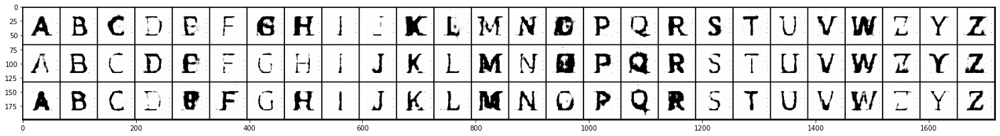

Starting epoch 2...


100%|██████████| 4116/4116 [05:21<00:00, 12.79it/s]


G_loss: 3.1087021827697754, D_loss: 0.42082691192626953


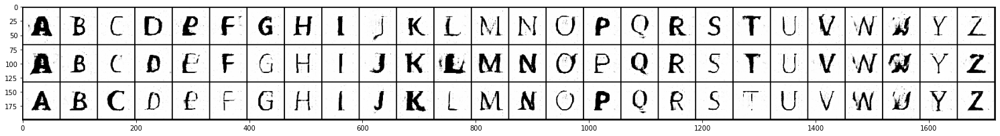

Starting epoch 3...


100%|██████████| 4116/4116 [05:18<00:00, 12.94it/s]


G_loss: 3.7869129180908203, D_loss: 0.3120051920413971


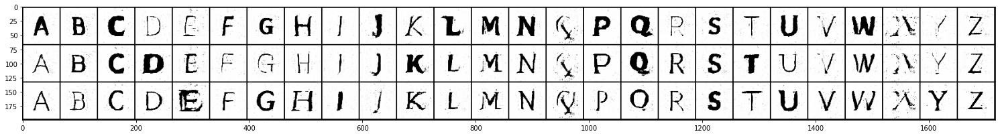

Starting epoch 4...


100%|██████████| 4116/4116 [05:20<00:00, 12.86it/s]


G_loss: 4.277746200561523, D_loss: 0.30982282757759094


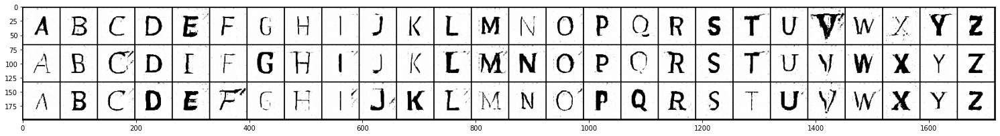

Starting epoch 5...


100%|██████████| 4116/4116 [05:52<00:00, 11.69it/s]


G_loss: 4.505537509918213, D_loss: 0.2903200685977936


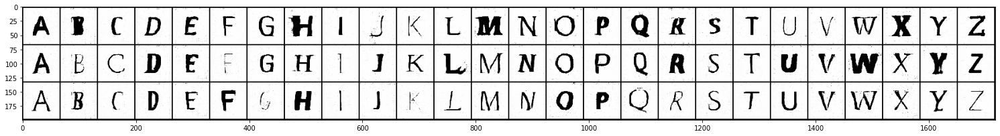

Starting epoch 6...


100%|██████████| 4116/4116 [05:18<00:00, 12.92it/s]


G_loss: 4.643148422241211, D_loss: 0.2825106084346771


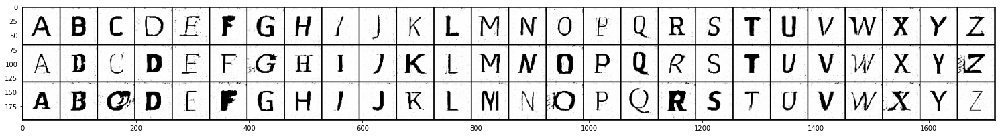

Starting epoch 7...


100%|██████████| 4116/4116 [05:32<00:00, 12.36it/s]


G_loss: 4.675595283508301, D_loss: 0.2804759442806244


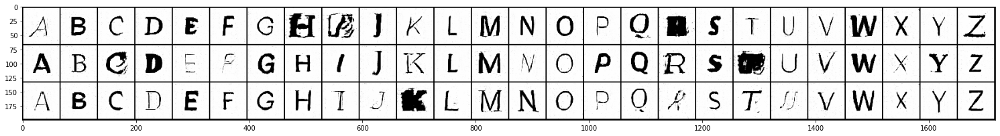

Starting epoch 8...


100%|██████████| 4116/4116 [05:22<00:00, 12.77it/s]


G_loss: 4.725855350494385, D_loss: 0.2799574136734009


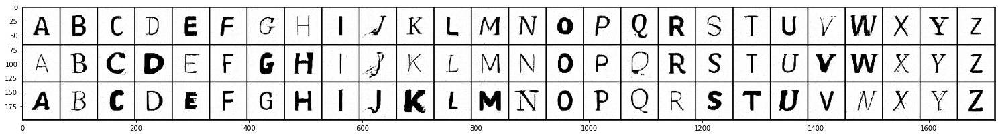

Starting epoch 9...


100%|██████████| 4116/4116 [05:26<00:00, 12.59it/s]


G_loss: 4.890552520751953, D_loss: 0.2681703269481659


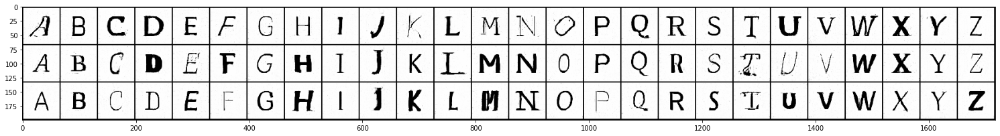

Starting epoch 10...


100%|██████████| 4116/4116 [05:32<00:00, 12.37it/s]


G_loss: 4.900407791137695, D_loss: 0.26861363649368286


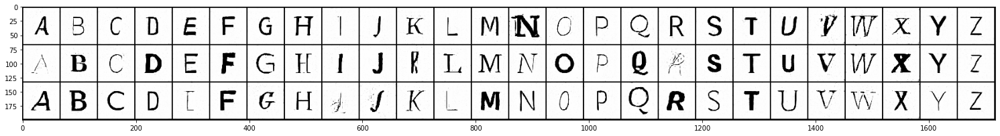

Starting epoch 11...


100%|██████████| 4116/4116 [05:48<00:00, 11.80it/s]


G_loss: 5.034003734588623, D_loss: 0.25689080357551575


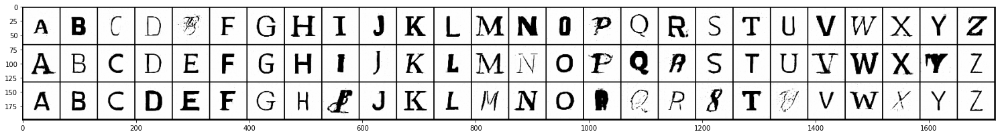

Starting epoch 12...


100%|██████████| 4116/4116 [05:45<00:00, 11.92it/s]


G_loss: 5.131051063537598, D_loss: 0.2508196532726288


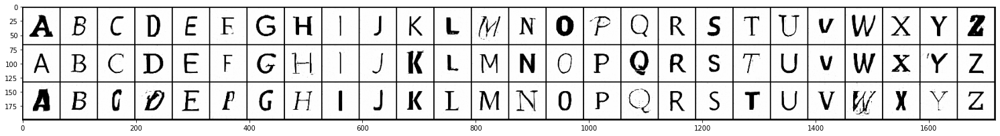

Starting epoch 13...


100%|██████████| 4116/4116 [05:36<00:00, 12.22it/s]


G_loss: 5.205883979797363, D_loss: 0.2398393601179123


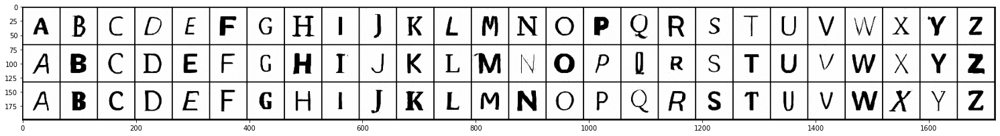

Starting epoch 14...


100%|██████████| 4116/4116 [05:35<00:00, 12.25it/s]


G_loss: 5.292806625366211, D_loss: 0.23156261444091797


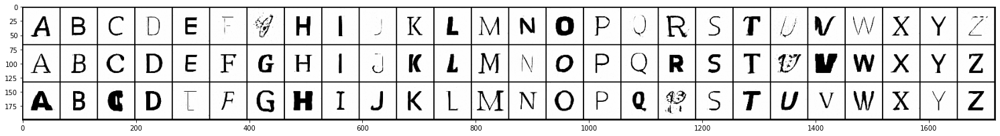

Starting epoch 15...


100%|██████████| 4116/4116 [05:41<00:00, 12.05it/s]


G_loss: 5.389736175537109, D_loss: 0.22560551762580872


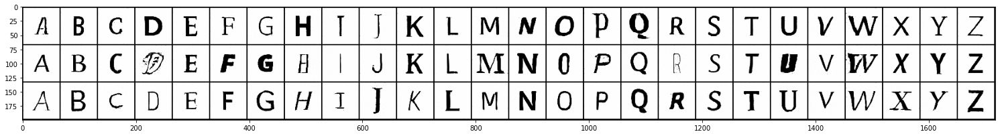

Starting epoch 16...


100%|██████████| 4116/4116 [05:40<00:00, 12.08it/s]


G_loss: 5.4391303062438965, D_loss: 0.21146059036254883


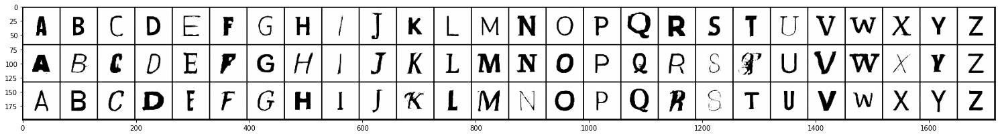

Starting epoch 17...


100%|██████████| 4116/4116 [05:41<00:00, 12.06it/s]


G_loss: 5.614314079284668, D_loss: 0.20459385216236115


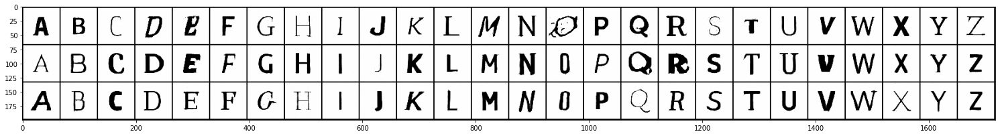

Starting epoch 18...


100%|██████████| 4116/4116 [05:40<00:00, 12.10it/s]


G_loss: 5.577647686004639, D_loss: 0.20029287040233612


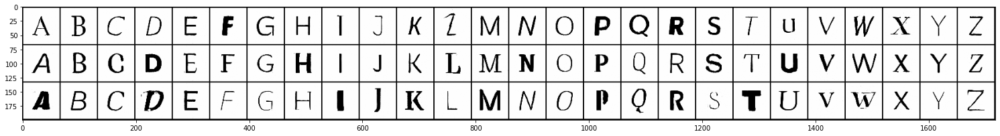

Starting epoch 19...


100%|██████████| 4116/4116 [05:48<00:00, 11.81it/s]


G_loss: 5.710145473480225, D_loss: 0.18846629559993744


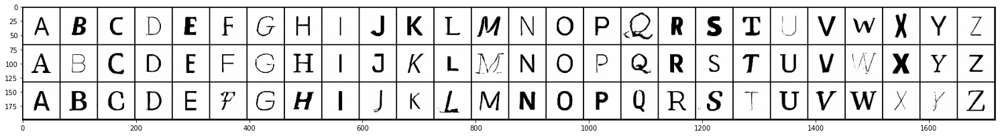

Starting epoch 20...


100%|██████████| 4116/4116 [05:52<00:00, 11.66it/s]


G_loss: 5.80634069442749, D_loss: 0.18911883234977722


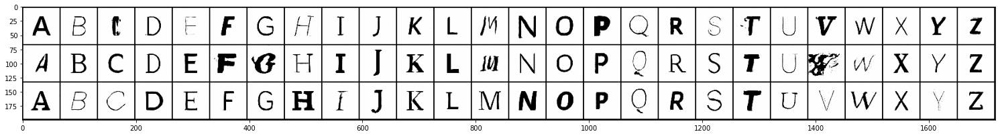

Starting epoch 21...


100%|██████████| 4116/4116 [05:37<00:00, 12.20it/s]


G_loss: 5.910981178283691, D_loss: 0.17340216040611267


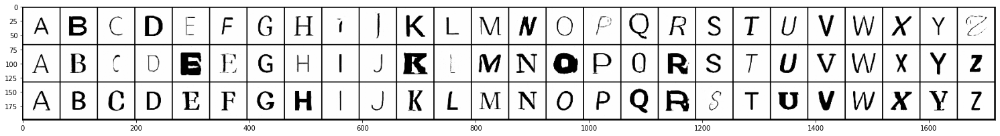

Starting epoch 22...


100%|██████████| 4116/4116 [05:40<00:00, 12.09it/s]


G_loss: 6.0112457275390625, D_loss: 0.16091038286685944


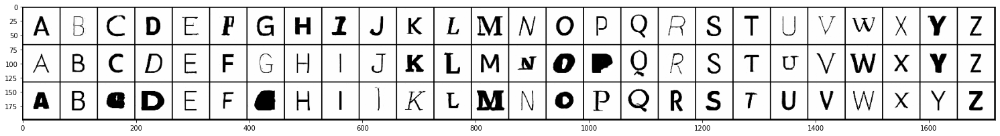

Starting epoch 23...


100%|██████████| 4116/4116 [05:43<00:00, 11.99it/s]


G_loss: 6.116865634918213, D_loss: 0.15234553813934326


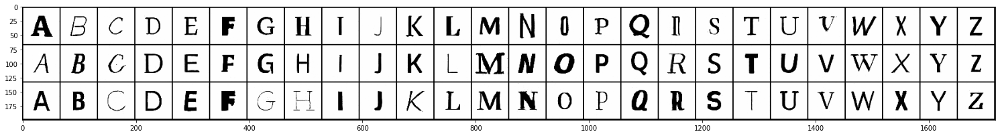

Starting epoch 24...


100%|██████████| 4116/4116 [05:34<00:00, 12.29it/s]


G_loss: 6.109750747680664, D_loss: 0.15135422348976135


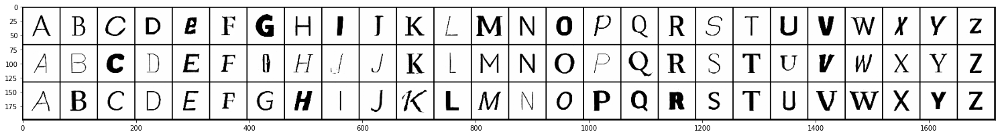

Starting epoch 25...


100%|██████████| 4116/4116 [05:26<00:00, 12.59it/s]


G_loss: 6.39204216003418, D_loss: 0.1325012743473053


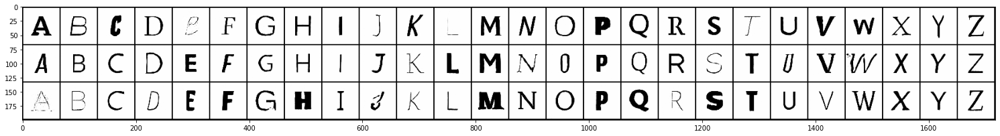

Starting epoch 26...


100%|██████████| 4116/4116 [05:26<00:00, 12.59it/s]


G_loss: 6.440526485443115, D_loss: 0.12818442285060883


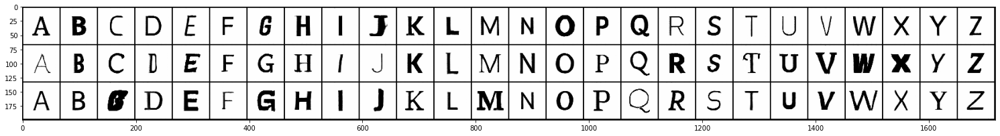

Starting epoch 27...


100%|██████████| 4116/4116 [05:25<00:00, 12.66it/s]


G_loss: 6.469198226928711, D_loss: 0.1272822916507721


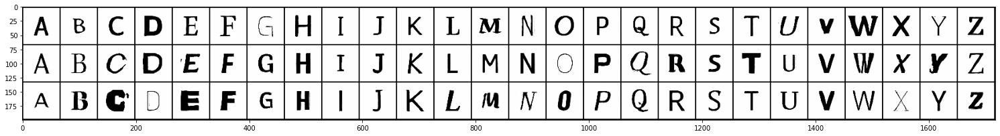

Starting epoch 28...


100%|██████████| 4116/4116 [05:22<00:00, 12.78it/s]


G_loss: 6.662308692932129, D_loss: 0.11082758009433746


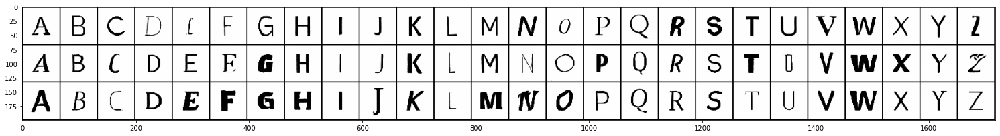

Starting epoch 29...


100%|██████████| 4116/4116 [05:26<00:00, 12.59it/s]


G_loss: 6.784178733825684, D_loss: 0.11118677258491516


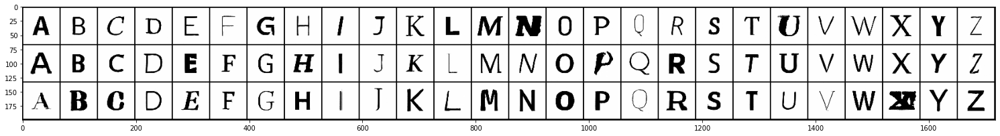

Starting epoch 30...


100%|██████████| 4116/4116 [05:23<00:00, 12.71it/s]


G_loss: 6.792646884918213, D_loss: 0.11498457938432693


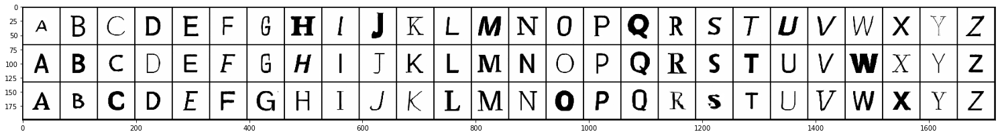

Starting epoch 31...


100%|██████████| 4116/4116 [05:42<00:00, 12.03it/s]


G_loss: 6.8486223220825195, D_loss: 0.10298842191696167


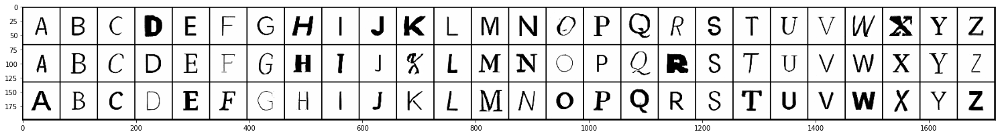

Starting epoch 32...


100%|██████████| 4116/4116 [05:23<00:00, 12.73it/s]


G_loss: 6.897214889526367, D_loss: 0.10010114312171936


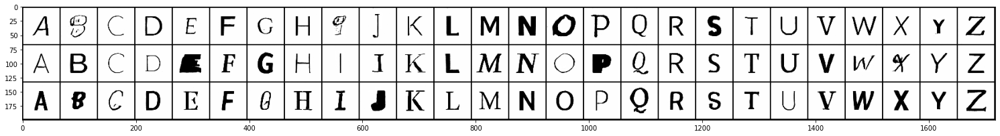

Starting epoch 33...


100%|██████████| 4116/4116 [05:27<00:00, 12.55it/s]


G_loss: 6.982782363891602, D_loss: 0.09132631123065948


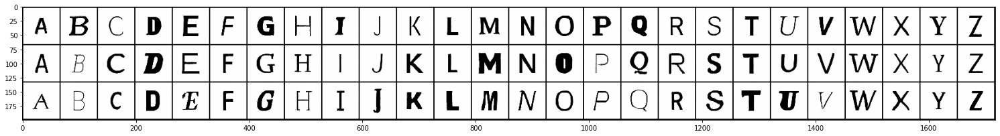

Starting epoch 34...


100%|██████████| 4116/4116 [05:24<00:00, 12.68it/s]


G_loss: 7.05661678314209, D_loss: 0.08911836892366409


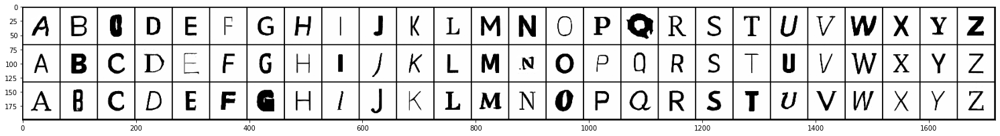

Starting epoch 35...


100%|██████████| 4116/4116 [05:19<00:00, 12.89it/s]


G_loss: 7.22939920425415, D_loss: 0.08124332875013351


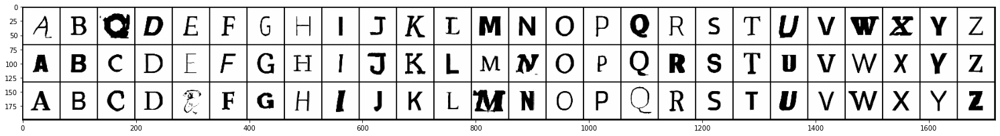

Starting epoch 36...


100%|██████████| 4116/4116 [05:23<00:00, 12.74it/s]


G_loss: 7.220272541046143, D_loss: 0.08578061312437057


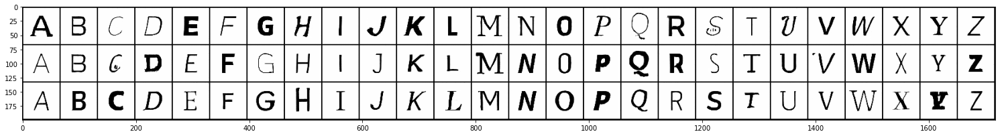

Starting epoch 37...


100%|██████████| 4116/4116 [05:28<00:00, 12.52it/s]


G_loss: 7.195890426635742, D_loss: 0.08635537326335907


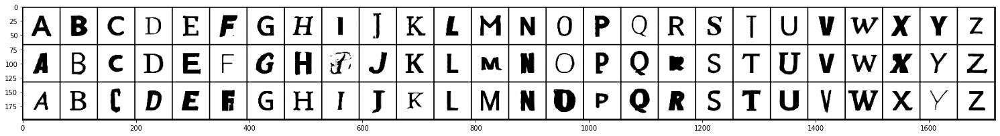

Starting epoch 38...


100%|██████████| 4116/4116 [05:33<00:00, 12.32it/s]


G_loss: 7.34451150894165, D_loss: 0.0819476768374443


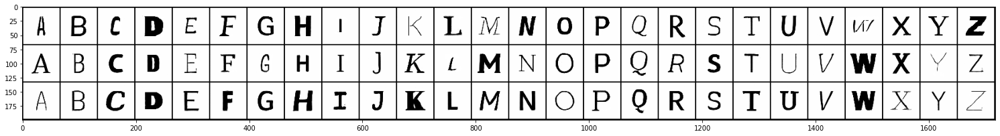

Starting epoch 39...


100%|██████████| 4116/4116 [05:47<00:00, 11.84it/s]


G_loss: 7.40081787109375, D_loss: 0.0714867115020752


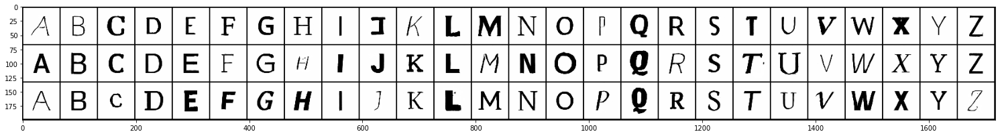

Starting epoch 40...


100%|██████████| 4116/4116 [05:34<00:00, 12.31it/s]


G_loss: 7.500557899475098, D_loss: 0.07598897814750671


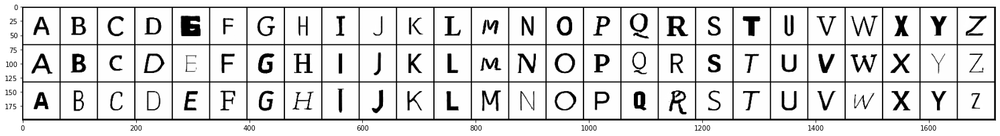

Starting epoch 41...


100%|██████████| 4116/4116 [05:35<00:00, 12.27it/s]


G_loss: 7.597358226776123, D_loss: 0.07031923532485962


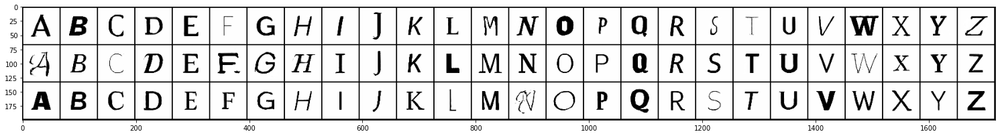

Starting epoch 42...


100%|██████████| 4116/4116 [05:31<00:00, 12.41it/s]


G_loss: 7.621199607849121, D_loss: 0.07072299718856812


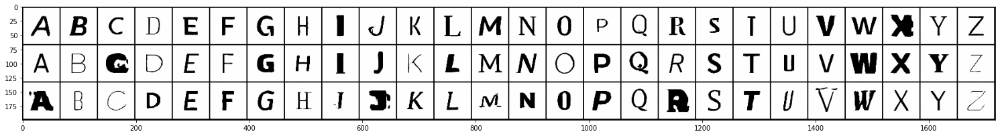

Starting epoch 43...


100%|██████████| 4116/4116 [05:36<00:00, 12.24it/s]


G_loss: 7.6446099281311035, D_loss: 0.06598647683858871


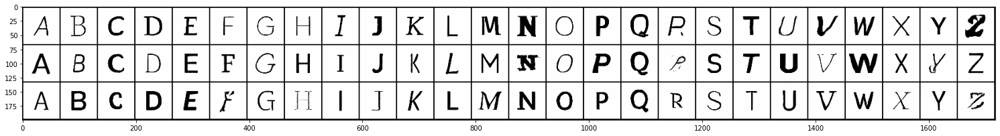

Starting epoch 44...


100%|██████████| 4116/4116 [05:43<00:00, 11.98it/s]


G_loss: 7.867229461669922, D_loss: 0.06108966842293739


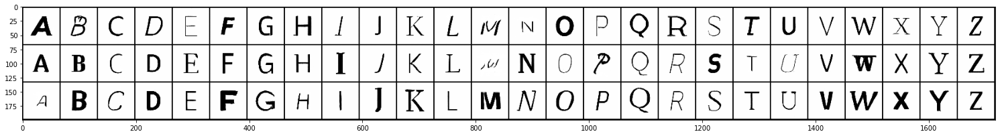

Starting epoch 45...


100%|██████████| 4116/4116 [05:37<00:00, 12.18it/s]


G_loss: 7.859148979187012, D_loss: 0.061711885035037994


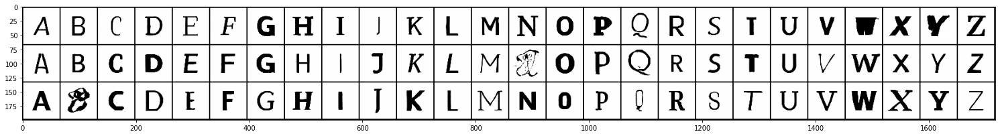

Starting epoch 46...


100%|██████████| 4116/4116 [05:38<00:00, 12.14it/s]


G_loss: 7.859560012817383, D_loss: 0.0627220869064331


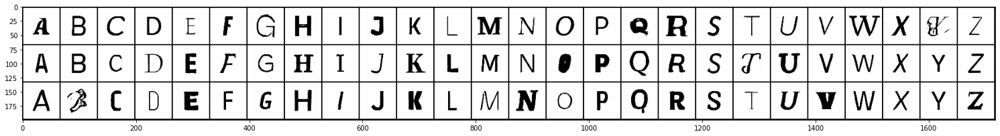

Starting epoch 47...


100%|██████████| 4116/4116 [05:33<00:00, 12.34it/s]


G_loss: 7.989964008331299, D_loss: 0.05861419439315796


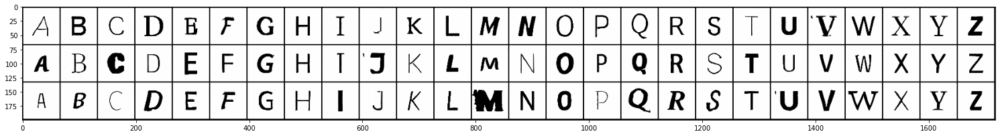

Starting epoch 48...


100%|██████████| 4116/4116 [05:47<00:00, 11.86it/s]


G_loss: 8.154275894165039, D_loss: 0.054088328033685684


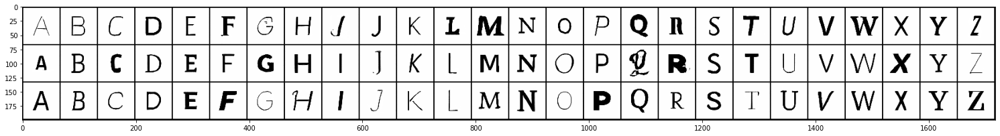

Starting epoch 49...


100%|██████████| 4116/4116 [06:08<00:00, 11.18it/s]


G_loss: 8.089920997619629, D_loss: 0.05713694170117378


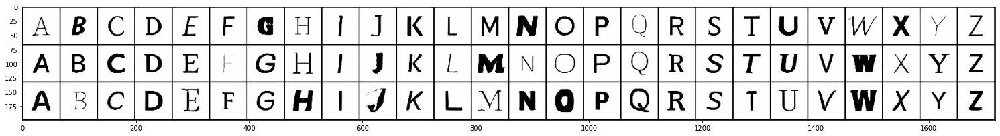

Starting epoch 50...


100%|██████████| 4116/4116 [06:11<00:00, 11.07it/s]


G_loss: 8.251660346984863, D_loss: 0.04861617833375931


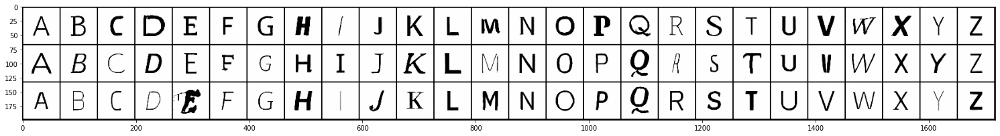

Starting epoch 51...


100%|██████████| 4116/4116 [05:33<00:00, 12.36it/s]


G_loss: 8.241555213928223, D_loss: 0.05164165794849396


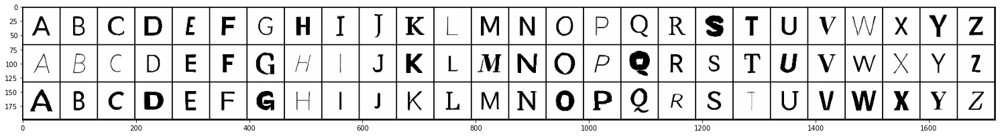

Starting epoch 52...


100%|██████████| 4116/4116 [05:37<00:00, 12.19it/s]


G_loss: 8.346599578857422, D_loss: 0.048825982958078384


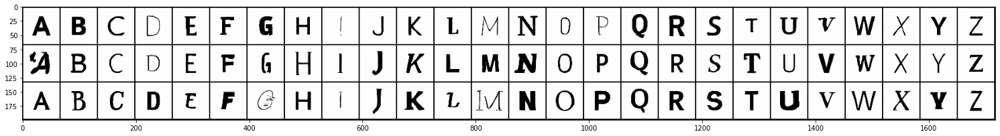

Starting epoch 53...


100%|██████████| 4116/4116 [05:33<00:00, 12.35it/s]


G_loss: 8.54506778717041, D_loss: 0.04582882300019264


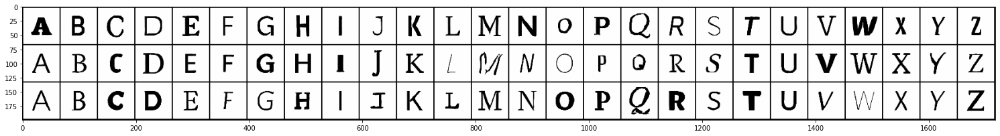

Starting epoch 54...


100%|██████████| 4116/4116 [05:33<00:00, 12.35it/s]


G_loss: 8.490203857421875, D_loss: 0.047478657215833664


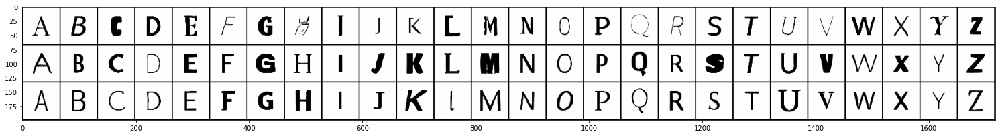

Starting epoch 55...


100%|██████████| 4116/4116 [05:37<00:00, 12.20it/s]


G_loss: 8.450361251831055, D_loss: 0.04825833812355995


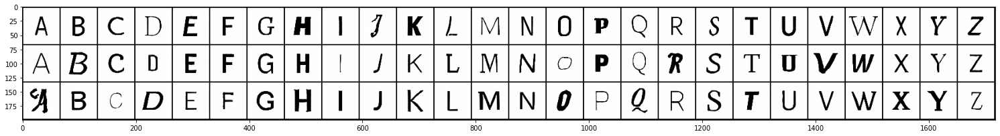

Starting epoch 56...


100%|██████████| 4116/4116 [05:39<00:00, 12.14it/s]


G_loss: 8.60439682006836, D_loss: 0.04735002666711807


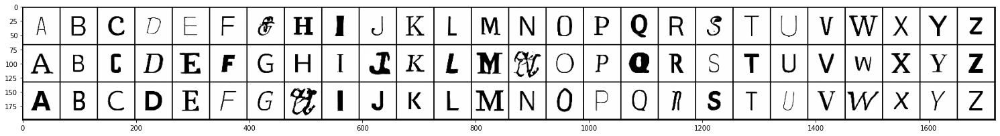

Starting epoch 57...


100%|██████████| 4116/4116 [05:33<00:00, 12.35it/s]


G_loss: 8.432551383972168, D_loss: 0.0492495559155941


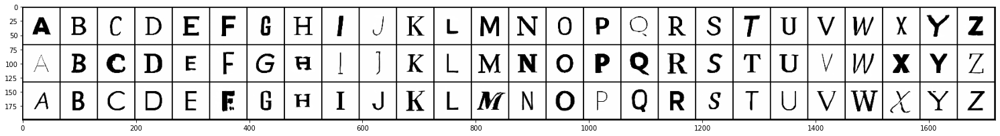

Starting epoch 58...


100%|██████████| 4116/4116 [05:40<00:00, 12.08it/s]


G_loss: 8.71090316772461, D_loss: 0.04297793656587601


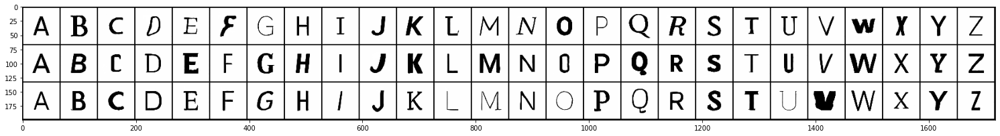

Starting epoch 59...


100%|██████████| 4116/4116 [05:36<00:00, 12.21it/s]


G_loss: 8.599954605102539, D_loss: 0.04203994944691658


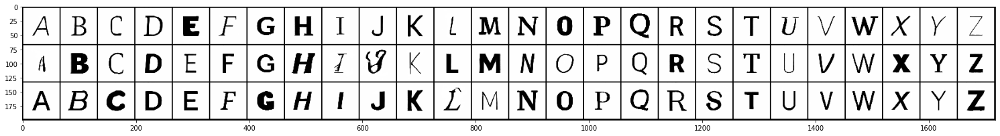

Starting epoch 60...


100%|██████████| 4116/4116 [05:35<00:00, 12.26it/s]


G_loss: 8.606043815612793, D_loss: 0.04190560802817345


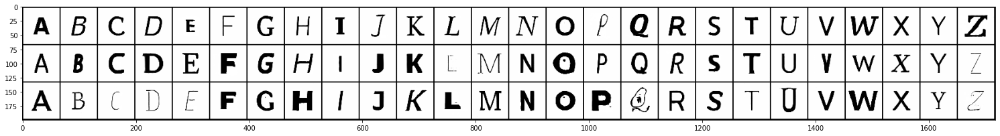

Starting epoch 61...


100%|██████████| 4116/4116 [05:37<00:00, 12.20it/s]


G_loss: 8.93910026550293, D_loss: 0.03908364474773407


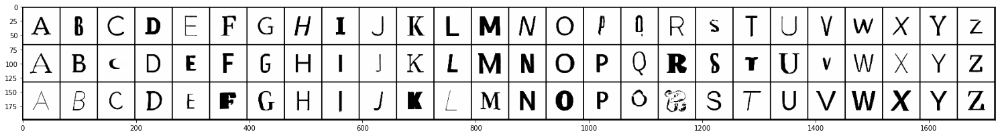

Starting epoch 62...


100%|██████████| 4116/4116 [05:39<00:00, 12.13it/s]


G_loss: 8.955381393432617, D_loss: 0.03814888000488281


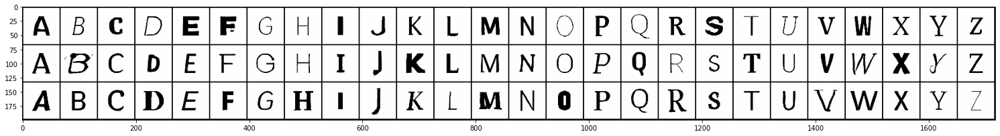

Starting epoch 63...


100%|██████████| 4116/4116 [05:43<00:00, 12.00it/s]


G_loss: 8.988304138183594, D_loss: 0.040216341614723206


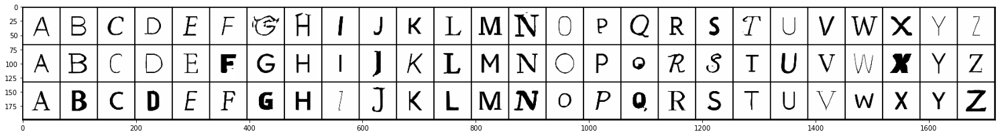

Starting epoch 64...


100%|██████████| 4116/4116 [05:41<00:00, 12.05it/s]


G_loss: 9.023720741271973, D_loss: 0.03581099212169647


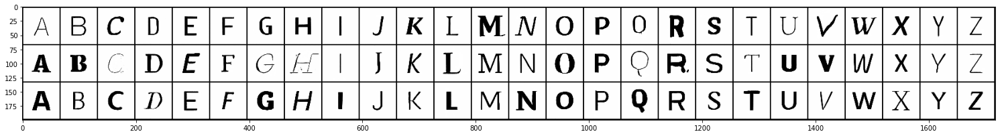

Starting epoch 65...


100%|██████████| 4116/4116 [05:41<00:00, 12.05it/s]


G_loss: 8.962352752685547, D_loss: 0.04180973395705223


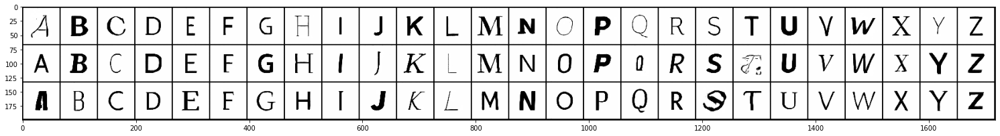

Starting epoch 66...


100%|██████████| 4116/4116 [05:55<00:00, 11.57it/s]


G_loss: 9.02930736541748, D_loss: 0.04026712104678154


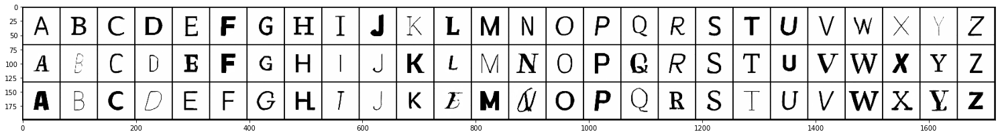

Starting epoch 67...


100%|██████████| 4116/4116 [05:58<00:00, 11.47it/s]


G_loss: 8.974383354187012, D_loss: 0.03209000453352928


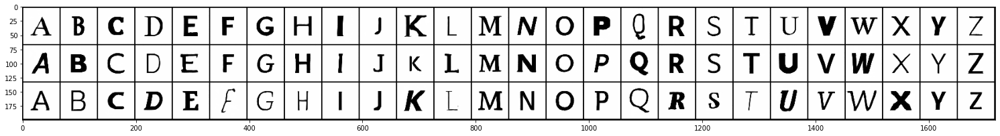

Starting epoch 68...


100%|██████████| 4116/4116 [06:09<00:00, 11.14it/s]


G_loss: 9.008749008178711, D_loss: 0.04307692497968674


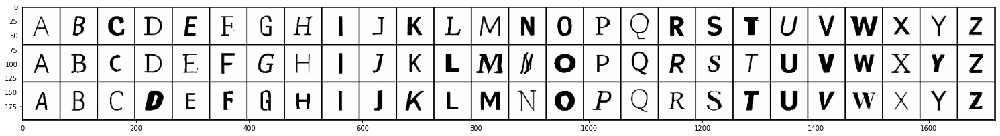

Starting epoch 69...


100%|██████████| 4116/4116 [06:05<00:00, 11.26it/s]


G_loss: 9.007319450378418, D_loss: 0.03836818039417267


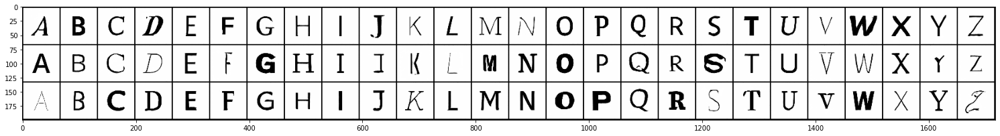

Starting epoch 70...


100%|██████████| 4116/4116 [06:04<00:00, 11.31it/s]


G_loss: 9.121147155761719, D_loss: 0.03255728632211685


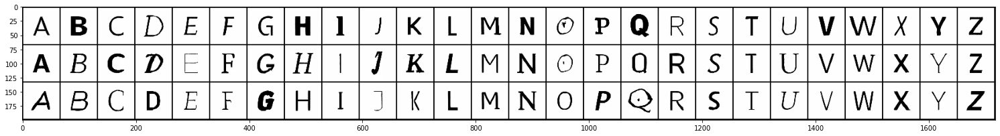

Starting epoch 71...


100%|██████████| 4116/4116 [06:04<00:00, 11.30it/s]


G_loss: 9.352392196655273, D_loss: 0.03044627420604229


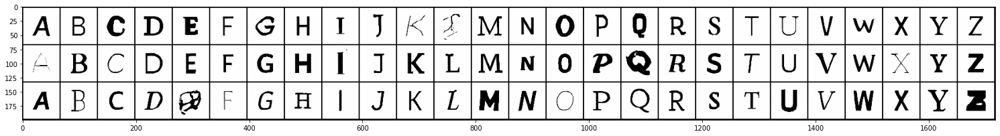

Starting epoch 72...


100%|██████████| 4116/4116 [06:07<00:00, 11.20it/s]


G_loss: 9.277922630310059, D_loss: 0.0352737158536911


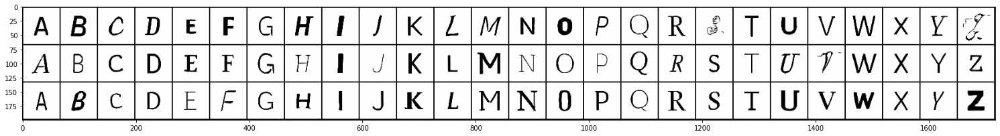

Starting epoch 73...


100%|██████████| 4116/4116 [06:01<00:00, 11.38it/s]


G_loss: 9.134960174560547, D_loss: 0.038854438811540604


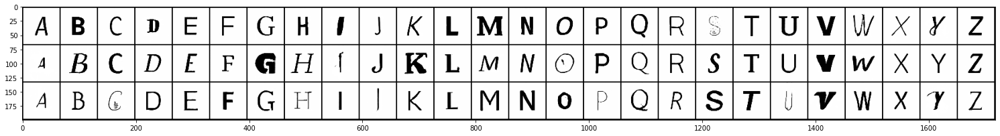

Starting epoch 74...


100%|██████████| 4116/4116 [06:05<00:00, 11.27it/s]


G_loss: 9.216629981994629, D_loss: 0.03436197713017464


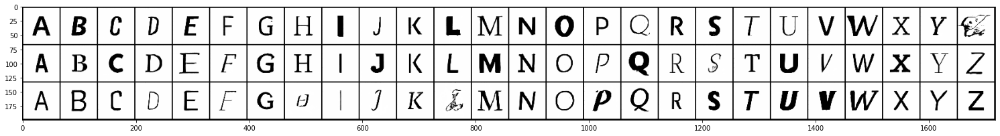

Starting epoch 75...


100%|██████████| 4116/4116 [06:05<00:00, 11.26it/s]


G_loss: 9.43632698059082, D_loss: 0.029346158728003502


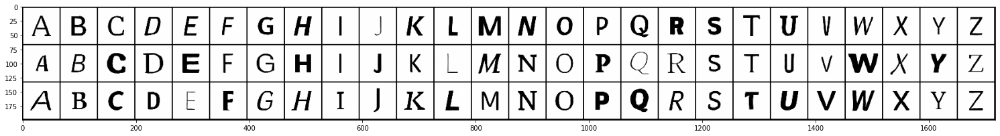

Starting epoch 76...


100%|██████████| 4116/4116 [06:17<00:00, 10.90it/s]


G_loss: 9.510231018066406, D_loss: 0.0314188189804554


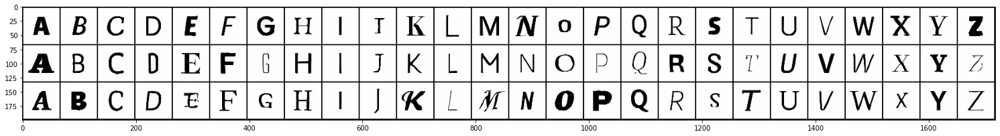

Starting epoch 77...


100%|██████████| 4116/4116 [06:02<00:00, 11.37it/s]


G_loss: 9.48117446899414, D_loss: 0.03295421600341797


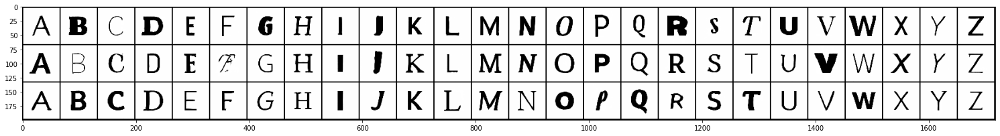

Starting epoch 78...


100%|██████████| 4116/4116 [05:50<00:00, 11.74it/s]


G_loss: 9.410547256469727, D_loss: 0.03054628148674965


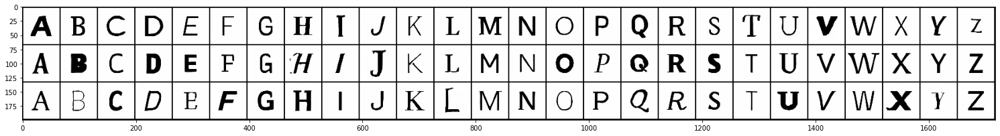

Starting epoch 79...


100%|██████████| 4116/4116 [05:47<00:00, 11.84it/s]


G_loss: 9.423604965209961, D_loss: 0.02870962582528591


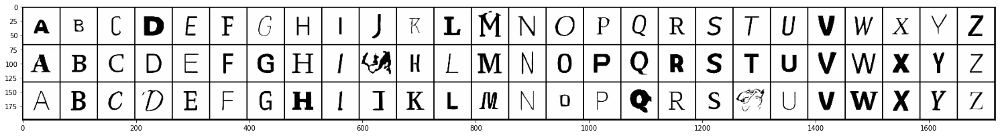

Starting epoch 80...


100%|██████████| 4116/4116 [06:21<00:00, 10.80it/s]


G_loss: 9.42476749420166, D_loss: 0.03433399647474289


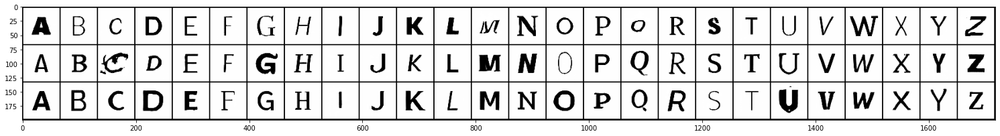

Starting epoch 81...


100%|██████████| 4116/4116 [05:45<00:00, 11.93it/s]


G_loss: 9.687620162963867, D_loss: 0.029072867706418037


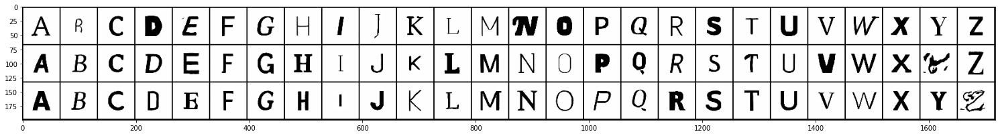

Starting epoch 82...


100%|██████████| 4116/4116 [05:36<00:00, 12.21it/s]


G_loss: 9.52722454071045, D_loss: 0.030819175764918327


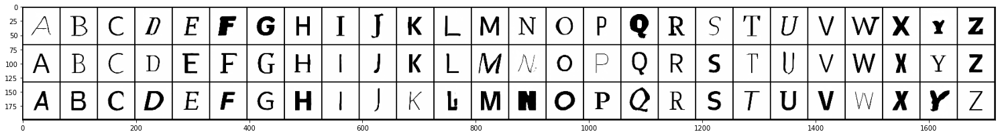

Starting epoch 83...


100%|██████████| 4116/4116 [05:38<00:00, 12.17it/s]


G_loss: 9.546432495117188, D_loss: 0.02957409806549549


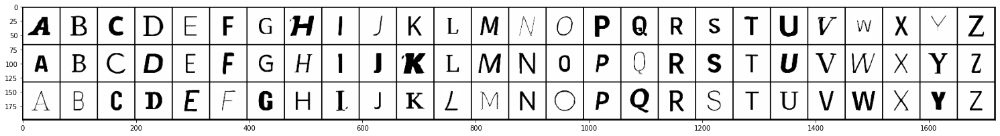

Starting epoch 84...


100%|██████████| 4116/4116 [05:25<00:00, 12.66it/s]


G_loss: 9.387587547302246, D_loss: 0.03314945474267006


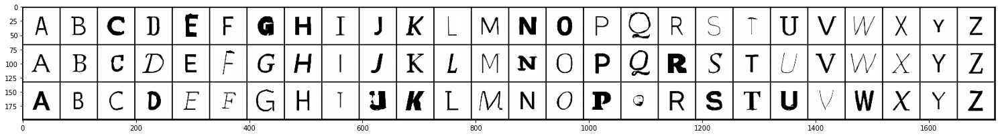

Starting epoch 85...


100%|██████████| 4116/4116 [05:20<00:00, 12.84it/s]


G_loss: 9.56462574005127, D_loss: 0.03238474205136299


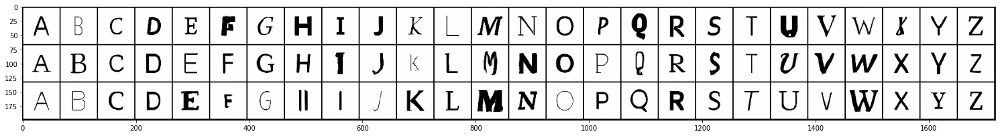

Starting epoch 86...


100%|██████████| 4116/4116 [05:48<00:00, 11.80it/s]


G_loss: 9.562679290771484, D_loss: 0.032710351049900055


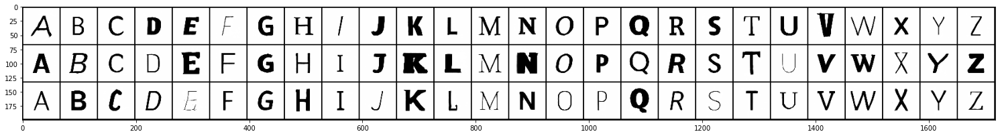

Starting epoch 87...


100%|██████████| 4116/4116 [05:30<00:00, 12.47it/s]


G_loss: 9.661872863769531, D_loss: 0.0315704271197319


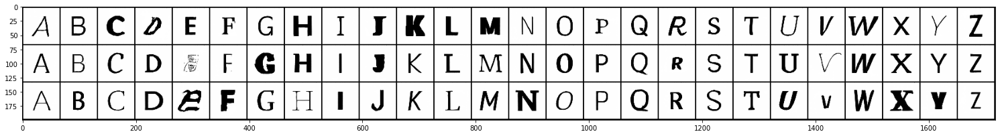

Starting epoch 88...


100%|██████████| 4116/4116 [05:15<00:00, 13.04it/s]


G_loss: 9.734904289245605, D_loss: 0.02875538356602192


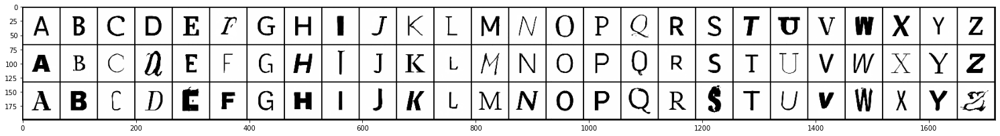

Starting epoch 89...


100%|██████████| 4116/4116 [05:25<00:00, 12.65it/s]


G_loss: 9.720534324645996, D_loss: 0.03036845289170742


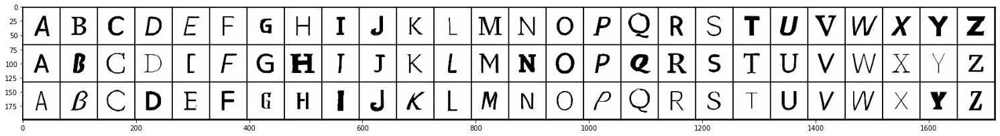

Starting epoch 90...


100%|██████████| 4116/4116 [05:14<00:00, 13.09it/s]


G_loss: 9.528535842895508, D_loss: 0.02951771952211857


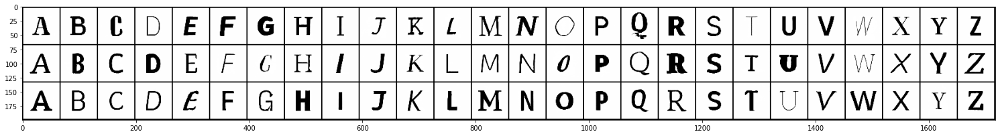

Starting epoch 91...


100%|██████████| 4116/4116 [05:31<00:00, 12.41it/s]


G_loss: 9.804015159606934, D_loss: 0.027972327545285225


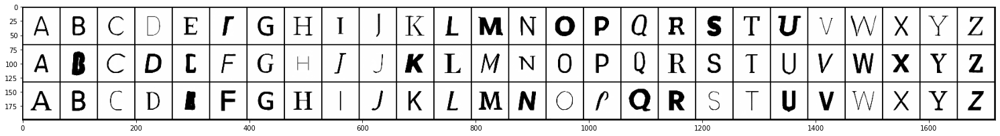

Starting epoch 92...


100%|██████████| 4116/4116 [05:15<00:00, 13.06it/s]


G_loss: 9.92175579071045, D_loss: 0.02966349385678768


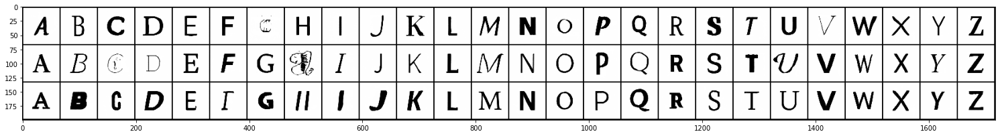

Starting epoch 93...


100%|██████████| 4116/4116 [05:42<00:00, 12.02it/s]


G_loss: 9.79615592956543, D_loss: 0.028274666517972946


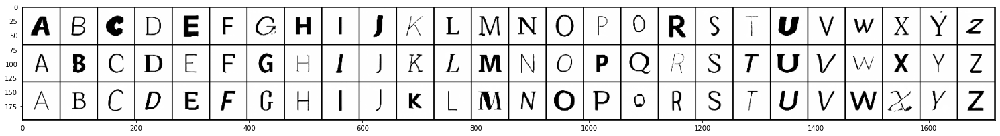

Starting epoch 94...


100%|██████████| 4116/4116 [05:23<00:00, 12.74it/s]


G_loss: 9.87959098815918, D_loss: 0.029484596103429794


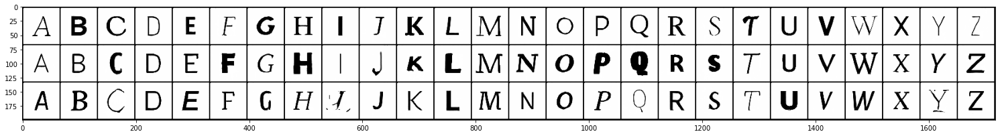

Starting epoch 95...


100%|██████████| 4116/4116 [05:36<00:00, 12.23it/s]


G_loss: 9.847843170166016, D_loss: 0.02759501338005066


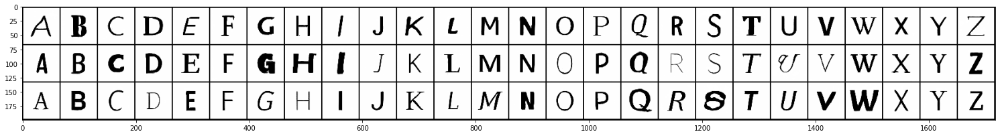

Starting epoch 96...


100%|██████████| 4116/4116 [05:37<00:00, 12.21it/s]


G_loss: 10.085054397583008, D_loss: 0.02393924631178379


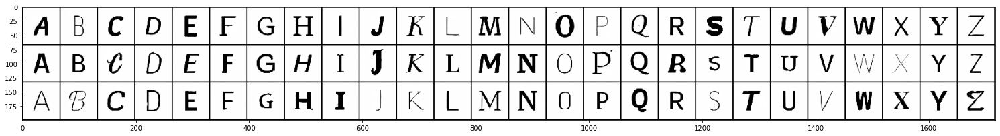

Starting epoch 97...


100%|██████████| 4116/4116 [05:37<00:00, 12.21it/s]


G_loss: 9.93738079071045, D_loss: 0.0272698812186718


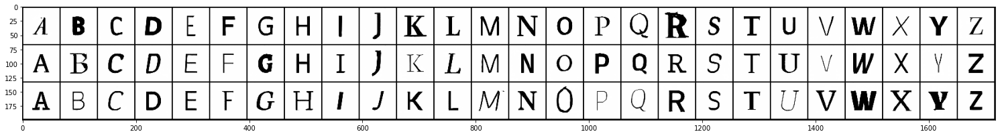

Starting epoch 98...


100%|██████████| 4116/4116 [05:33<00:00, 12.33it/s]


G_loss: 9.86737060546875, D_loss: 0.02838974818587303


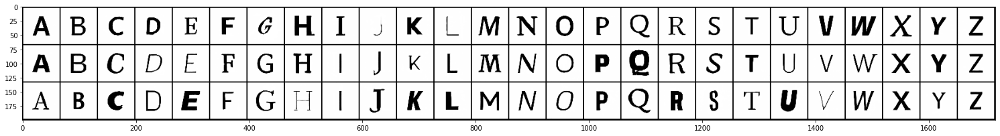

Starting epoch 99...


100%|██████████| 4116/4116 [05:32<00:00, 12.37it/s]


G_loss: 10.0101900100708, D_loss: 0.02849837951362133


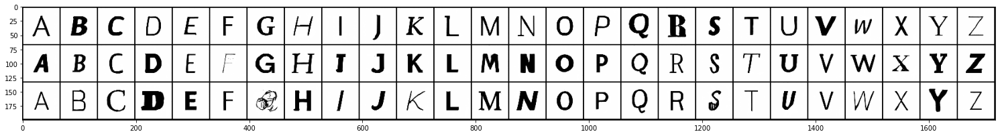

Starting epoch 100...


100%|██████████| 4116/4116 [05:35<00:00, 12.27it/s]


G_loss: 9.874850273132324, D_loss: 0.02487293817102909


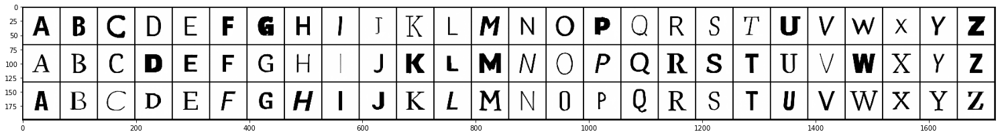

In [21]:
history = []
for epoch in range(epochs):
    print('Starting epoch {}...'.format(epoch+1))
    G_losses, D_losses = [], []
    for images, labels in tqdm(data_loader):
        # Train data
        real_images = Variable(images).to(device)
        labels = Variable(labels).to(device)

        # Set generator train
        generator.train()

        # Train discriminator
        d_loss = discriminator_train_step(len(real_images), discriminator,
                                          generator, d_optimizer, criterion,
                                          real_images, labels)
        
        # Train generator
        g_loss = generator_train_step(batch_size, discriminator, generator, g_optimizer, criterion)

        G_losses.append(g_loss)
        D_losses.append(d_loss)
   
    info = {
            "epoch": epoch + 1,
            "G_loss": np.mean(G_losses),
            "D_loss": np.mean(D_losses),
            }
    history.append(info)
    torch.save(generator.state_dict(), "./GAN_thr18/{}.pth".format(epoch + 1))
    # Set generator eval)
    # torch.save(discriminator.state_dict(), "discriminator_01weight_thr11.pth")
    # Set generator eval
    generator.eval()
    print('G_loss: {}, D_loss: {}'.format(np.mean(G_losses), np.mean(D_losses)))
    

    z = Variable(torch.randn(3 * 26, z_size, 1, 1)).to(device)

    # Labels 0 ~ 9
    labels = Variable(torch.LongTensor([i for _ in range(3) for i in range(class_num)])).to(device)

    # Generating images
    sample_images = generator(z, labels)

    sample_images = sample_images.data.cpu()
    grid = make_grid(sample_images, nrow=26, normalize=True).permute(1,2,0).numpy()
    fig, ax = plt.subplots(figsize=(26,26))
    plt.imshow(grid)
    plt.savefig("./GAN_thr18/{}.png".format(epoch + 1))
    plt.show()

    # z = Variable(torch.randn(class_num * class_num, z_size, 1, 1)).to(device)

    # # Labels 0 ~ 9
    # labels = Variable(torch.LongTensor([i for _ in range(class_num) for i in range(class_num)])).to(device)

    # # Generating images
    # sample_images = generator(z, labels)

    # output_list = []
    # for label, image in zip(labels, sample_images):
    #     output = model_list[label](image.unsqueeze(0))
    #     output_list.append(output.item())
    # # print(output_list)
    # print("average:{}".format(np.mean(output_list)))

    # sample_images = sample_images.data.cpu()

    # # Show images
    # grid = make_grid(sample_images, nrow=26, normalize=True).permute(1,2,0).numpy()
    # plt.figure(figsize=(26, 26))
    # plt.imshow(grid)
    # plt.show()
history = pd.DataFrame(history)

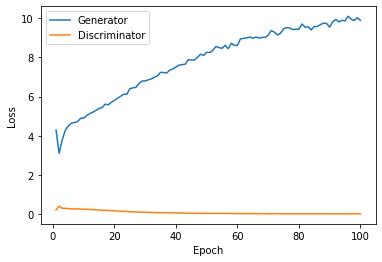

In [22]:
fig, ax = plt.subplots()
# 損失の推移を描画する。
ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["D_loss"], label="Discriminator")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()
plt.show()
fig.savefig("./GAN_thr18/loss.png", facecolor="white")

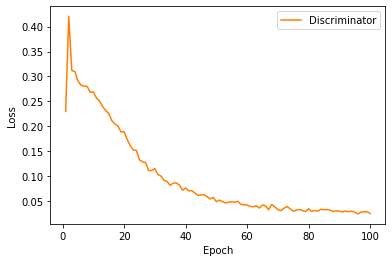

In [23]:
plt.plot(history["epoch"], history["D_loss"], color='#ff7f00',label="Discriminator")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.savefig("./GAN_thr18/d_loss.png", facecolor="white")
plt.show()

## - Show Generating Images

In [24]:
pretrained_model = "googlefonts.pth"
use_cuda = True
class cNet(nn.Module):
    def __init__(self):
        super(cNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(57600, 128)
        self.fc2 = nn.Linear(128, 26)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.fc2(x)
        output = F.log_softmax(x, dim=1)
        return output

# MNISTのTest datasetと dataloaderの定義
# test_loader = torch.utils.data.DataLoader(
#     datasets.MNIST('../data', train=False, download=True, transform=transforms.Compose([
#             transforms.ToTensor(),
#             transforms.Normalize((0.5,), (0.5,))
#             ])), 
#         batch_size=1, shuffle=False)

# 使うデバイス（CPUかGPUか）の定義
print("CUDA Available: ",torch.cuda.is_available())
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")

# ネットワークの初期化
cmodel = cNet().to(device)
print(cmodel)
# 訓練済みモデルのロード
cmodel.load_state_dict(torch.load(pretrained_model, map_location='cpu'))

CUDA Available:  True
cNet(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (dropout1): Dropout(p=0.25, inplace=False)
  (dropout2): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=57600, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=26, bias=True)
)


<All keys matched successfully>

In [25]:
for i in range(1, 101):    
    z = Variable(torch.randn(26 * 26, z_size, 1, 1)).to(device)

    # Labels 0 ~ 9
    labels = Variable(torch.LongTensor([i for _ in range(class_num) for i in range(class_num)])).to(device)

    generator.load_state_dict(torch.load("./GAN_thr18/{}.pth".format(i), map_location='cpu'))

    # Generating images
    sample_images = generator(z, labels)

    reg_list = []
    false = 0
    for image, label in zip(sample_images, labels):
        image, label = image.unsqueeze(0).to(device), label.unsqueeze(0).type(torch.LongTensor).to(device)

        # データをモデルに順伝播させます
        output = cmodel(image)
        init_pred = output.max(1, keepdim=True)[1] # 最大の確率のインデックスを取得します。

        # 最初から予測が間違っている場合、攻撃する必要がないため次のイテレーションに進みます。
        
        if init_pred.item() != label.item():
            false += 1
            continue

        reg_list.append(model_list[label.item()](image).item())

        if len(reg_list) == 500:
            break

    # print(reg_list)
    print("{}:{}".format(i, np.mean(reg_list)))


# z = Variable(torch.randn(3 * 26, z_size, 1, 1)).to(device)

# # Labels 0 ~ 9
# labels = Variable(torch.LongTensor([i for _ in range(3) for i in range(class_num)])).to(device)

# # Generating images
# sample_images = generator(z, labels)

# sample_images = sample_images.data.cpu()
# grid = make_grid(sample_images, nrow=26, normalize=True).permute(1,2,0).numpy()
# fig, ax = plt.subplots(figsize=(26,26))
# plt.imshow(grid)
# plt.savefig("./GAN_thr20/final.png")

1:19.248307580947877
2:18.655186933517456
3:18.8727124042511
4:18.636956024169923
5:18.09580408859253
6:17.831537415504457
7:17.29909732246399
8:17.973669118881226
9:17.801093142509462
10:17.521554377555848
11:17.75499172782898
12:17.776742639541627
13:17.989989664077758
14:17.526683844566346
15:17.59437352848053
16:17.522309285163878
17:17.6793640499115
18:17.956347243309022
19:17.888092244148254
20:17.58052317619324
21:17.420263821601868
22:17.44347712993622
23:17.679387739181518
24:18.09281422805786
25:17.331656521081925
26:17.484359581947327
27:17.602239542007446
28:17.910804500579832
29:17.93688267707825
30:17.689259850502015
31:17.748013423919677
32:17.461646059989928
33:17.985868837356566
34:17.689088788986204
35:17.360743799209594
36:17.65965086364746
37:17.302576188087464
38:17.374389963150023
39:17.859951580047607
40:18.057616266250612
41:17.8855823097229
42:17.809357924461366
43:17.969326513290405
44:17.656705595970156
45:17.89352552127838
46:17.888683453559874
47:18.0946228